In [13]:
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt
from time import time
from multiprocessing.pool import ThreadPool, Pool
from numba import njit, prange

In [16]:
# Constants
c = 3e8  # Speed of light (m/s)

In [17]:
@njit
def generate_frequencies(N, K, carrier_frequency, bandwidth):
    """Generates an NxK matrix of sub-carrier frequencies."""
    freq_min = carrier_frequency - bandwidth / 2
    freq_max = carrier_frequency + bandwidth / 2
    total_subcarriers = N * K
    subcarrier_frequencies = np.linspace(freq_min, freq_max, total_subcarriers + 1)
    window_centers = (subcarrier_frequencies[:-1] + subcarrier_frequencies[1:]) / 2
    return window_centers.reshape(N, K)


@njit(parallel = True)
def generate_channel_matrix(N, K, L, f_c, B, A, d_users, angles_deg, Mx, My, Lx, Ly):
    """Generates the channel matrix h for the system."""
    f_nk = generate_frequencies(N, K, f_c, B)
    d_l = generate_distances(Lx, Ly, Mx, My, d_users, angles_deg)
    #print(d_l)
    h = np.zeros((N, K, L), dtype=np.complex128)
    for n in prange(N):
        for k in prange(K):
            for l in prange(L):
                Omega_l = A / (4 * np.pi * d_l[n, l]**2)
                tau_l = d_l[n, l] / c
                h[n, k, l] = np.sqrt(Omega_l) * np.exp(-1j * 2 * np.pi * f_nk[n, k] * tau_l)
    return h

@njit
def calculate_ksi_2(N, N0, P):
    """Calculates the ksi value."""
    return 2 * N * N0 / P

@njit(parallel = True)
def generate_distances(Lx, Ly, Mx, My, d_centers, angles_deg):
    """
    Generates distances from sub-elements of an antenna array to multiple users,
    given the distance from the center of the array to each user and
    the angle between the array and each user.

    Parameters:
        Lx (int): Number of sub-elements along the x-axis (horizontal).
        Ly (int): Number of sub-elements along the y-axis (vertical).
        Mx (float): Width of the antenna array in meters (x-axis).
        My (float): Height of the antenna array in meters (y-axis).
        d_centers (np.ndarray): Array of distances from the center of the array to each user (size N).
        angles_deg (np.ndarray): Array of angles (in degrees) from the array to each user (size N).

    Returns:
        np.ndarray: Array of shape (N, Lx * Ly) representing distances from each sub-element
                    to each user.
    """
    # Ensure d_centers and angles_deg are numpy arrays
    #d_centers = np.asarray(d_centers)
    #angles_deg = np.asarray(angles_deg)

    # Convert angles to radians
    angles_rad = np.deg2rad(angles_deg)

    # Generate positions of antenna sub-elements
    x_positions = np.zeros(Lx * Ly)
    y_positions = np.zeros(Lx * Ly)
    index = 0
    for i in prange(Lx):
        for j in prange(Ly):
            x_positions[index] = -Mx / 2 + (Mx / (Lx - 1)) * i
            if(Ly > 1):
                y_positions[index] = -My / 2 + (My / (Ly - 1)) * j
            else:
                y_positions[index] = 0
            index += 1

    L = x_positions.size  # Total number of sub-elements

    # Calculate user positions in the global coordinate system
    user_x = d_centers * np.cos(angles_rad)  # Shape (N,)
    user_y = d_centers * np.sin(angles_rad)  # Shape (N,)

    # Compute distances for all users and sub-elements
    d_l = np.zeros((d_centers.size, L))  # Output array of shape (N, L)
    for n in prange(d_centers.size):
        for l in range(L):
            dx = x_positions[l] - user_x[n]
            dy = y_positions[l] - user_y[n]
            d_l[n, l] = np.sqrt(dx**2 + dy**2)

    return d_l


In [53]:
def calculate_v_opt(N, K, L, g, N0, P, b):
    """Calculates the optimal beamforming vector v."""
    ksi = np.sqrt(calculate_ksi_2(N, N0, P))
    j = complex(0, 1)
    n_phases = 2 ** b
    phases = np.linspace(0, 2 * np.pi, 2 ** b, endpoint=False)
    v = np.zeros((N, K, 1, L), dtype=np.complex64)
    res_max = 0
    v_opt = v.copy()
    phaseshifts_opt = np.ones(L, dtype=np.complex64)

    for l in range(L):
        res_max = 0
        for phaseshift in phases:
            v[:, :, :, l] = np.exp(-j*phaseshift)
            #t00 = time()
            mat = v @ g / ksi
            #print(time() - t00)
            res = np.sum(np.log2(1+ np.power(np.abs(mat), 2)))
            if(res > res_max):
                res_max = res
                phaseshifts_opt[l] = phaseshift
                v[:, :, :, l] = np.exp(-j*phaseshifts_opt[l])

    for l in range(L):
        v_opt[:, :, :, l] = np.exp(-j*phaseshifts_opt[l])
            

    return v_opt


In [54]:
# CUPY

def generate_distances_cp(Lx, Ly, Mx, My, d_centers, angles_deg):
    """
    Generates distances from sub-elements of an antenna array to multiple users,
    given the distance from the center of the array to each user and
    the angle between the array and each user.

    Parameters:
        Lx (int): Number of sub-elements along the x-axis (horizontal).
        Ly (int): Number of sub-elements along the y-axis (vertical).
        Mx (float): Width of the antenna array in meters (x-axis).
        My (float): Height of the antenna array in meters (y-axis).
        d_centers (np.ndarray): Array of distances from the center of the array to each user (size N).
        angles_deg (np.ndarray): Array of angles (in degrees) from the array to each user (size N).

    Returns:
        np.ndarray: Array of shape (N, Lx * Ly) representing distances from each sub-element
                    to each user.
    """
    # Ensure d_centers and angles_deg are numpy arrays
    d_centers = cp.asarray(d_centers)
    angles_deg = cp.asarray(angles_deg)

    # Convert angles to radians
    angles_rad = cp.deg2rad(angles_deg)

    # Antenna sub-element positions relative to the center
    x_positions = cp.linspace(-Mx / 2, Mx / 2, Lx)
    #y_positions = np.linspace(-My / 2, My / 2, Ly)
    y_positions = cp.array([0])         #ULA
    x_grid, y_grid = cp.meshgrid(x_positions, y_positions)
    
    # Flatten sub-element positions to create a list of (x, y) coordinates
    x_flat = x_grid.ravel()
    y_flat = y_grid.ravel()
    L = x_flat.size  # Total number of sub-elements

    # Calculate user positions in the global coordinate system
    user_x = d_centers * cp.cos(angles_rad)  # Shape (N,)
    user_y = d_centers * cp.sin(angles_rad)  # Shape (N,)

    # Compute distances for all users and sub-elements
    d_l = cp.zeros((d_centers.size, L))  # Output array of shape (N, L)
    for n in range(d_centers.size):
        d_l[n, :] = cp.sqrt((x_flat - user_x[n])**2 + (y_flat - user_y[n])**2)

    return d_l



def calculate_v_opt_cp(N, K, L, g, N0, P, b):
    """Calculates the optimal beamforming vector v."""
    ksi = cp.sqrt(cp.array([calculate_ksi_2(N, N0, P)]))
    j = complex(0, 1)
    n_phases = 2 ** b
    phases = cp.linspace(0, 2 * cp.pi, 2 ** b, endpoint=False)
    v = cp.zeros((N, K, 1, L), dtype=cp.complex64)
    res_max = 0
    v_opt = v.copy()
    phaseshifts_opt = cp.ones(L, dtype=cp.complex64)

    for l in range(L):
        res_max = 0
        for phaseshift in phases:
            v[:, :, :, l] = cp.exp(-j*phaseshift)
            #t00 = time()
            mat = v @ g / ksi
            cp.cuda.Device().synchronize()
            #print(time() - t00)
            res = cp.sum(cp.log2(1+ cp.power(cp.abs(mat), 2)))
            if(res > res_max):
                res_max = res
                phaseshifts_opt[l] = phaseshift
                v[:, :, :, l] = cp.exp(-j*phaseshifts_opt[l])

    for l in range(L):
        v_opt[:, :, :, l] = cp.exp(-j*phaseshifts_opt[l])
            

    return v_opt


0.00011777877807617188
0.00026297569274902344
0.00025343894958496094
0.0001659393310546875
0.00011777877807617188
0.00012183189392089844
8.034706115722656e-05
0.0001239776611328125
8.893013000488281e-05
9.393692016601562e-05
9.799003601074219e-05
8.058547973632812e-05
0.00011897087097167969
0.00011181831359863281
0.00011301040649414062
9.250640869140625e-05
7.82012939453125e-05
7.557868957519531e-05
0.00012373924255371094
8.893013000488281e-05
7.772445678710938e-05
7.557868957519531e-05
8.988380432128906e-05
7.653236389160156e-05
7.510185241699219e-05
7.486343383789062e-05
8.96453857421875e-05
7.486343383789062e-05
7.486343383789062e-05
0.00011730194091796875
9.846687316894531e-05
7.987022399902344e-05
7.677078247070312e-05
9.369850158691406e-05
7.557868957519531e-05
7.486343383789062e-05
7.462501525878906e-05
8.606910705566406e-05
7.510185241699219e-05
7.510185241699219e-05
L = 10
0.00017499923706054688
0.00013017654418945312
0.00014662742614746094
0.0001266002655029297
0.000123739242

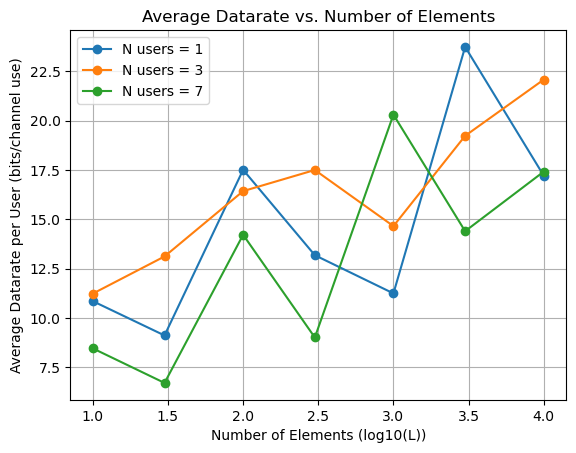

In [269]:
t0 = time()
# Parameters
n_users = [1, 3, 7]
N = 7
K = 2000 // N                   # If we have 1GHz total B and 0.2MHz one subf B
f_c = 3e10
B = 0.2e6                       #per user per subcarrier
lam = c / f_c
A = (lam / 4)**2
d = 50
N0 = 1e-12
P = 1
b = 2
Mx, My = 1, 1
L_vals = [10, 30, 100, 300, 1000, 3000, 10000]   #[10, 30, 100, 300, 1000, 3000, 10000]
#Lx_vals = [2, 5, 10, 15, 25, 50, 100]
#Ly_vals = [5, 6, 10, 20, 40, 60, 100]

avg_datarates = np.zeros((len(n_users), len(L_vals)))

for i, N in enumerate(n_users):
    d_users = np.full(N, d)
    K = 2000 // N
    B_total = B * N * K
    angles_deg = np.concatenate((np.linspace(10, 90, (N-1)//2, endpoint=False), np.linspace(90, 170, N-((N-1)//2))))
    #angles_deg = np.full(N, 90)
    for idx, L in enumerate(L_vals):
        Lx, Ly = L_vals[idx], 1                 # ULA
        g = generate_channel_matrix(N, K, L, f_c, B_total, A, d_users, angles_deg, Mx, My, Lx, Ly)
        #v_optimal = calculate_v_opt(N, K, L, g, N0, P)
        g = g.reshape(g.shape[0], g.shape[1], g.shape[2], 1)
        v_optimal = calculate_v_opt(N, K, L, g, N0, P, b)
        #v_optimal = np.array(v_optimal)

        total_datarate = 0
        
        vec_opt = v_optimal @ g
        val_opt = np.power(np.abs(vec_opt), 2)
        gamma_U_nk = (P / (2 * N * K)) * val_opt / (N0 / K)
        total_datarate += np.sum(np.log2(1 + gamma_U_nk))
        
        avg_datarates[i, idx] = total_datarate / (N * K)

        print("L = " + str(L))

t_calc = time() - t0
print(t_calc)

# Plot results
plt.figure()
for i, N in enumerate(n_users):
    plt.plot(np.log10(L_vals), avg_datarates[i, :], '-o', label=f'N users = {N}')
plt.xlabel('Number of Elements (log10(L))')
plt.ylabel('Average Datarate per User (bits/channel use)')
plt.title('Average Datarate vs. Number of Elements')
plt.legend()
plt.grid()
plt.show()


These results are bad just because the calculate_v_opt function was not right at the time of calculation. And I don't want to rerun it again for 9k seconds. Computation complexity remains the same, so I will just let it be

MATLAB results for comparison, calculation time = 13k seconds

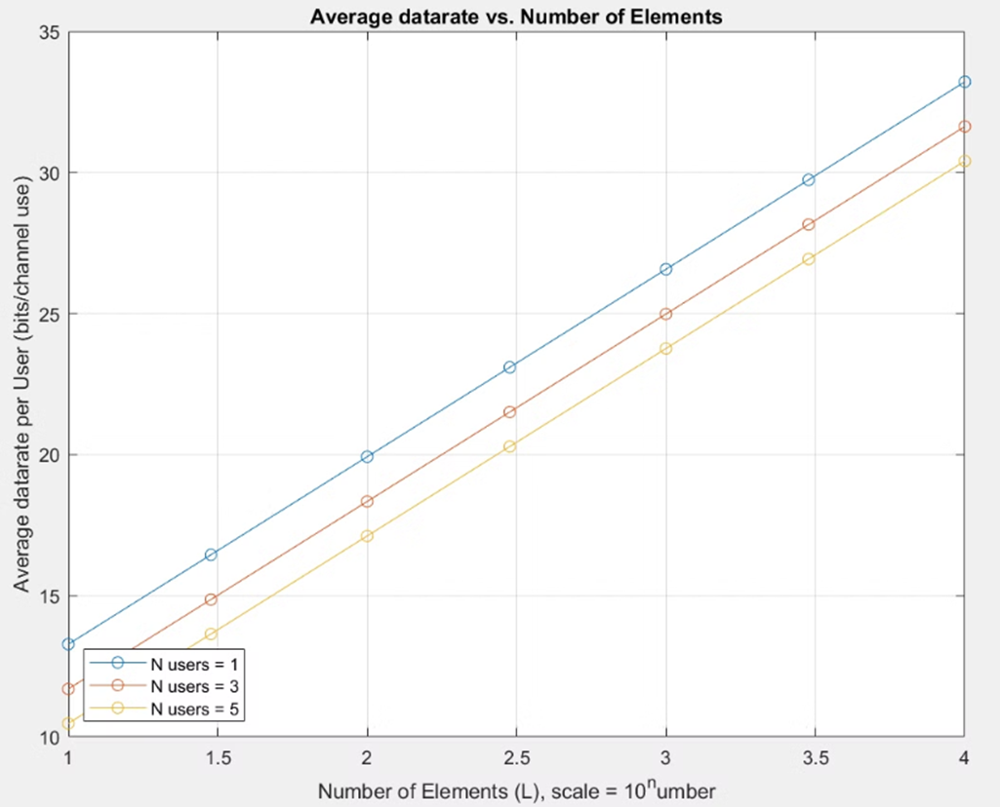

0.0009274482727050781
0.00047898292541503906
0.0003075599670410156
0.0002770423889160156
0.0006051063537597656
0.00045490264892578125
0.0010230541229248047
0.0006008148193359375
0.0003809928894042969
0.00026154518127441406
0.0003330707550048828
0.00027108192443847656
0.0003998279571533203
0.0004181861877441406
0.00028634071350097656
0.0004324913024902344
0.0005967617034912109
0.000446319580078125
0.00028586387634277344
0.0005133152008056641
0.0004208087921142578
0.0007586479187011719
0.0006182193756103516
0.0006077289581298828
0.00035190582275390625
0.0003724098205566406
0.00038552284240722656
0.0003743171691894531
0.0004279613494873047
0.0003292560577392578
0.0003612041473388672
0.00040435791015625
0.0003361701965332031
0.00028514862060546875
0.00044655799865722656
0.0005323886871337891
0.0009911060333251953
0.0010213851928710938
0.000576019287109375
0.0022630691528320312
L = 10
0.0009374618530273438
0.00044536590576171875
0.0005884170532226562
0.0006718635559082031
0.0004198551177978

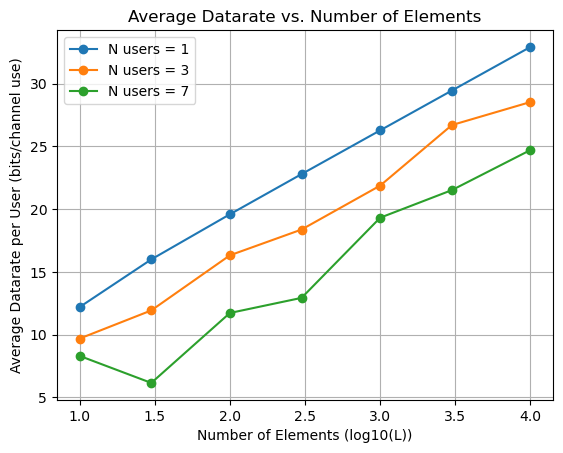

In [47]:
t0 = time()
# Parameters
n_users = [1, 3, 7]
N = 7
K = 2000 // N                   # If we have 1GHz total B and 0.2MHz one subf B
f_c = 3e10
B = 0.2e6                       #per user per subcarrier
lam = c / f_c
A = (lam / 4)**2
d = 50
N0 = 1e-12
P = 1
b = 2
Mx, My = 1, 1
L_vals = [10, 30, 100, 300, 1000, 3000, 10000]   #[10, 30, 100, 300, 1000, 3000, 10000]
#Lx_vals = [2, 5, 10, 15, 25, 50, 100]
#Ly_vals = [5, 6, 10, 20, 40, 60, 100]

avg_datarates = cp.zeros((len(n_users), len(L_vals)))

for i, N in enumerate(n_users):
    d_users = np.full(N, d)
    K = 2000 // N
    B_total = B * N * K
    angles_deg = np.concatenate((np.linspace(10, 90, (N-1)//2, endpoint=False), np.linspace(90, 170, N-((N-1)//2))))
    #angles_deg = np.full(N, 90)
    for idx, L in enumerate(L_vals):
        Lx, Ly = L_vals[idx], 1                 # ULA
        g = cp.array(generate_channel_matrix(N, K, L, f_c, B_total, A, d_users, angles_deg, Mx, My, Lx, Ly))
        #v_optimal = calculate_v_opt(N, K, L, g, N0, P)
        g = g.reshape(g.shape[0], g.shape[1], g.shape[2], 1)
        v_optimal = calculate_v_opt_cp(N, K, L, g, N0, P, b)
        #v_optimal = np.array(v_optimal)

        total_datarate = 0
        
        vec_opt = v_optimal @ g
        val_opt = cp.power(cp.abs(vec_opt), 2)
        gamma_U_nk = (P / (2 * N * K)) * val_opt / (N0 / K)
        total_datarate += cp.sum(cp.log2(1 + gamma_U_nk))
        
        avg_datarates[i, idx] = total_datarate / (N * K)

        print("L = " + str(L))

t_calc = time() - t0
print(t_calc)

# Plot results
plt.figure()
for i, N in enumerate(n_users):
    plt.plot(np.log10(L_vals), avg_datarates[i, :].get(), '-o', label=f'N users = {N}')
plt.xlabel('Number of Elements (log10(L))')
plt.ylabel('Average Datarate per User (bits/channel use)')
plt.title('Average Datarate vs. Number of Elements')
plt.legend()
plt.grid()
plt.show()

Here the results are not straight lines because of discretization of u (2^b = 2^2 possible phase-shift angles). Also the datarate is worse than in MATLAB, same reason. And also, the drop of datarate for N=7 L=10^1.5 most likely occures because of how i generate users. They are linspaced, and for N=1 he is always on 90 deg from ULA line -> max datarate, but for N=7 most of users are on the bad angles, far from 90 deg

Also we can see that one matmul computation time is 10 times lower for GPU

In [55]:
def timing(n):
    n_users = [n]
    N = 7
    K = 2000 // N                   # If we have 1GHz total B and 0.2MHz one subf B
    f_c = 3e10
    B = 0.2e6                       #per user per subcarrier
    lam = c / f_c
    A = (lam / 4)**2
    d = 50
    N0 = 1e-12
    P = 1
    b = 2
    Mx, My = 1, 1
    L_vals = [10, 30, 100, 300, 1000, 3000]   #[10, 30, 100, 300, 1000, 3000, 10000]
    times = np.zeros(len(L_vals))
    timesg = np.zeros(len(L_vals))

    for i, N in enumerate(n_users):
        d_users = np.full(N, d)
        K = 2000 // N
        B_total = B * N * K
        angles_deg = np.concatenate((np.linspace(10, 90, (N-1)//2, endpoint=False), np.linspace(90, 170, N-((N-1)//2))))
        #angles_deg = np.full(N, 90)
        for idx, L in enumerate(L_vals):
            Lx, Ly = L_vals[idx], 1                 # ULA
            g = generate_channel_matrix(N, K, L, f_c, B_total, A, d_users, angles_deg, Mx, My, Lx, Ly)
            gg = cp.array(generate_channel_matrix(N, K, L, f_c, B_total, A, d_users, angles_deg, Mx, My, Lx, Ly))
            #v_optimal = calculate_v_opt(N, K, L, g, N0, P)
            g = g.reshape(g.shape[0], g.shape[1], g.shape[2], 1)
            gg = gg.reshape(gg.shape[0], gg.shape[1], gg.shape[2], 1)
            t0 = time()
            calculate_v_opt(N, K, L, g, N0, P, b)
            times[idx] = time() - t0
            t0 = time()
            calculate_v_opt_cp(N, K, L, gg, N0, P, b)
            timesg[idx] = time() - t0

    return times, timesg

In [50]:
times1, timesg1 = timing(1)

0.00032401084899902344
0.00013875961303710938
8.749961853027344e-05
0.00011467933654785156
7.915496826171875e-05
7.200241088867188e-05
7.009506225585938e-05
6.985664367675781e-05
6.937980651855469e-05
0.00011706352233886719
8.082389831542969e-05
7.152557373046875e-05
7.033348083496094e-05
6.961822509765625e-05
6.961822509765625e-05
6.937980651855469e-05
6.961822509765625e-05
6.937980651855469e-05
6.914138793945312e-05
8.320808410644531e-05
6.961822509765625e-05
6.961822509765625e-05
6.914138793945312e-05
6.914138793945312e-05
6.961822509765625e-05
0.00011491775512695312
0.00010585784912109375
9.703636169433594e-05
9.918212890625e-05
9.632110595703125e-05
0.00010180473327636719
0.00011610984802246094
0.00011682510375976562
0.00010943412780761719
0.0001659393310546875
8.273124694824219e-05
0.00010156631469726562
7.081031799316406e-05
6.961822509765625e-05
6.937980651855469e-05
0.0015423297882080078
0.0003528594970703125
0.0002818107604980469
0.00028443336486816406
0.00027489662170410156


In [32]:
def print1plot(points, data1, label1, title="ue", xlabel = "n", ylabel = "f(Xn)", marker = None):
    plt.figure(figsize=(15, 5))
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.plot(points, data1, c = 'k', label=label1, marker=marker)
    plt.title(title)
    plt.autoscale(axis='both')
    plt.legend()
    plt.grid()
    plt.show()

def print2plot(points, data1, label1, data2, label2, title="ue", xlabel = "n", ylabel = "f(Xn)", marker = None):
    plt.figure(figsize=(15, 5))
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.plot(points, data1, c = 'r', label=label1, marker=marker)
    plt.plot(points, data2, c = 'g', label=label2, marker=marker)
    plt.title(title)
    plt.autoscale(axis='both')
    plt.legend()
    plt.grid()
    plt.show()

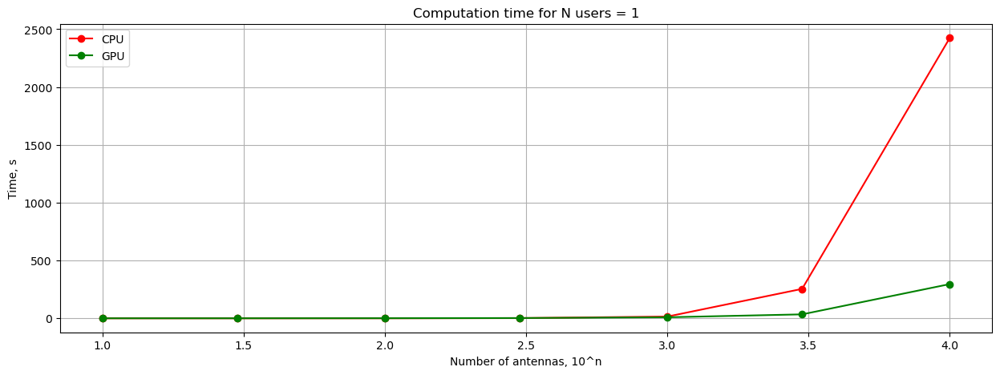

/tmp/ipykernel_1774/4184490058.py:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


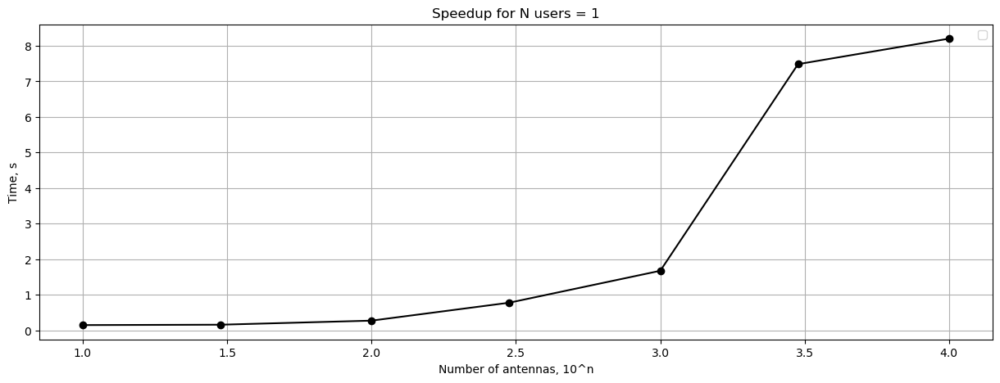

In [51]:
Ls = np.array([10, 30, 100, 300, 1000, 3000, 10000])
print2plot(np.log10(Ls), times1, "CPU", timesg1, "GPU", "Computation time for N users = 1", "Number of antennas, 10^n", "Time, s", "o")
print1plot(np.log10(Ls), times1 / timesg1, "", "Speedup for N users = 1", "Number of antennas, 10^n", "Time, s", "o")

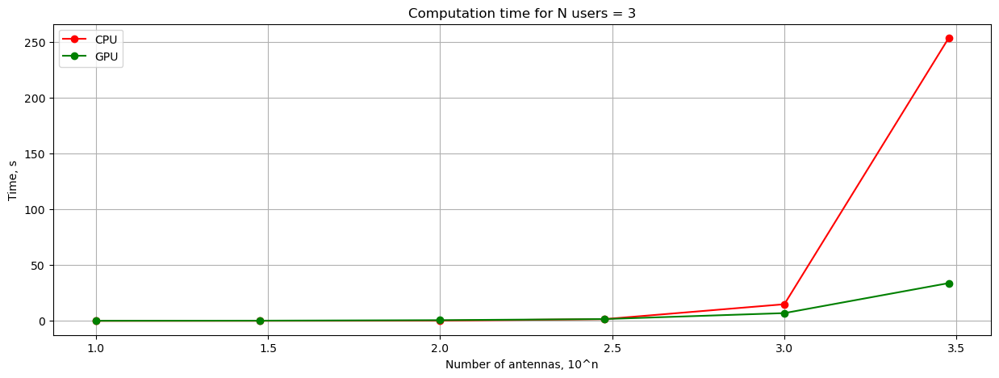

/tmp/ipykernel_1774/4184490058.py:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


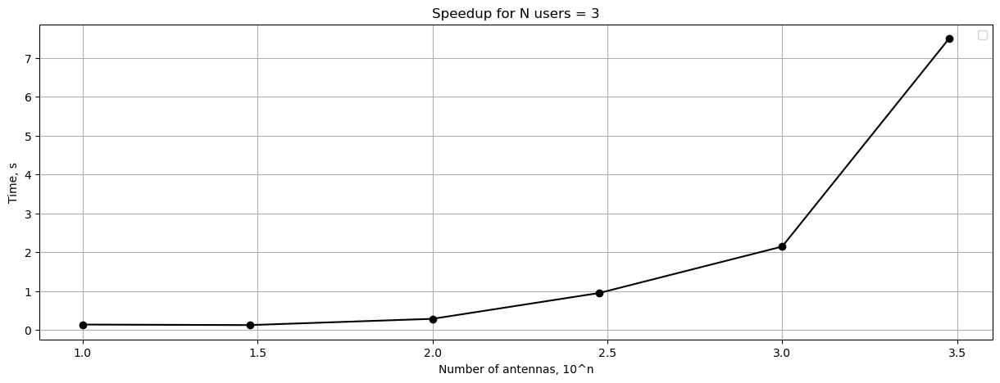

In [57]:
times3, timesg3 = timing(3)
Ls = np.array([10, 30, 100, 300, 1000, 3000])
print2plot(np.log10(Ls), times3, "CPU", timesg3, "GPU", "Computation time for N users = 3", "Number of antennas, 10^n", "Time, s", "o")
print1plot(np.log10(Ls), times3 / timesg3, "", "Speedup for N users = 3", "Number of antennas, 10^n", "Time, s", "o")

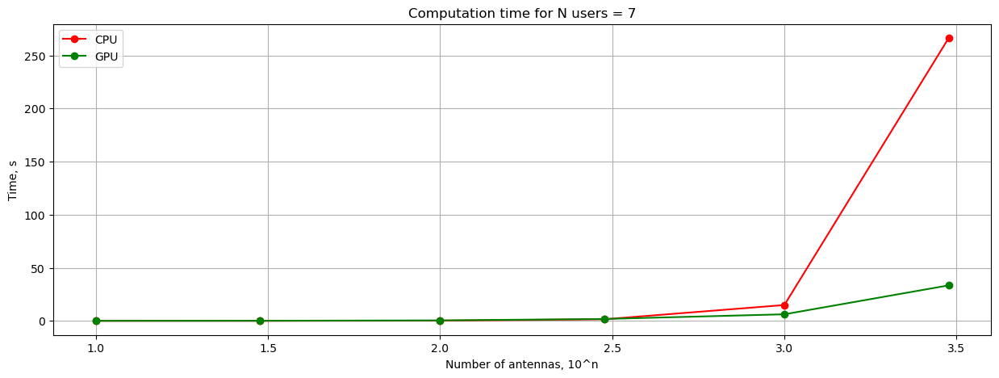

/tmp/ipykernel_1774/4184490058.py:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


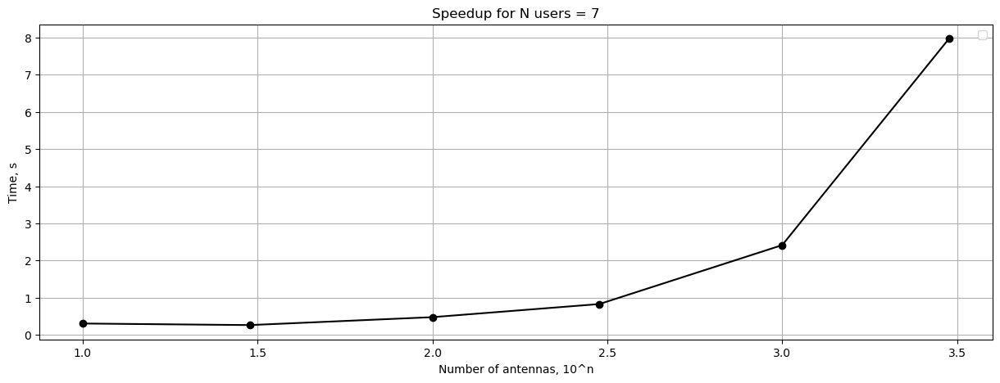

In [58]:
times7, timesg7 = timing(7)
Ls = np.array([10, 30, 100, 300, 1000, 3000])
print2plot(np.log10(Ls), times7, "CPU", timesg7, "GPU", "Computation time for N users = 7", "Number of antennas, 10^n", "Time, s", "o")
print1plot(np.log10(Ls), times7 / timesg7, "", "Speedup for N users = 7", "Number of antennas, 10^n", "Time, s", "o")

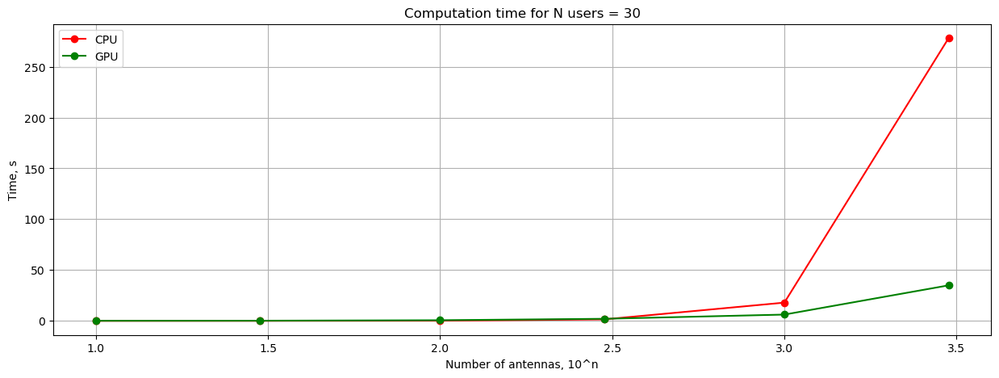

/tmp/ipykernel_1774/4184490058.py:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


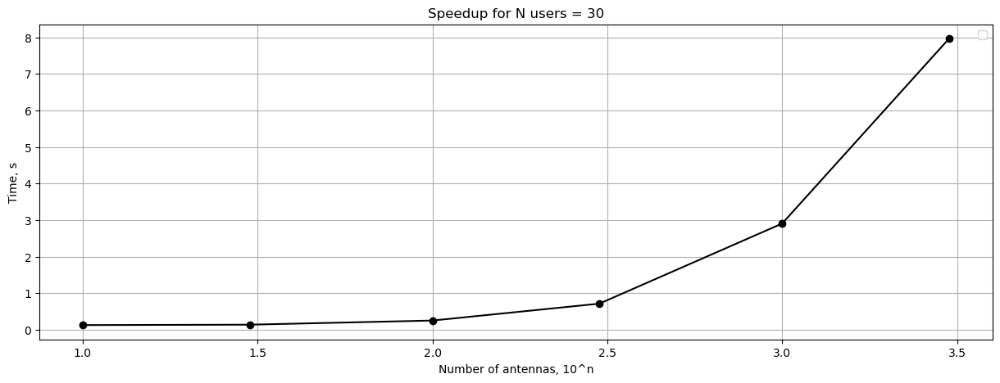

In [88]:
times30, timesg30 = timing(30)
Ls = np.array([10, 30, 100, 300, 1000, 3000])
print2plot(np.log10(Ls), times30, "CPU", timesg30, "GPU", "Computation time for N users = 30", "Number of antennas, 10^n", "Time, s", "o")
print1plot(np.log10(Ls), times30 / timesg30, "", "Speedup for N users = 30", "Number of antennas, 10^n", "Time, s", "o")

In [65]:
mempool = cp.get_default_memory_pool()
pinned_mempool = cp.get_default_pinned_memory_pool()
print(mempool.used_bytes())
print(mempool.total_bytes())
print(mempool.get_limit())
print(mempool.n_free_blocks())
print(pinned_mempool.n_free_blocks())

584681984
1738276352
0
33
7


In [75]:
def time_matmul(N, K, L, n_runs):
    vc = np.ones((N, K, 1, L), dtype=np.complex64)
    gc = np.ones((N, K, L, 1), dtype=np.complex64)
    vg = cp.ones((N, K, 1, L), dtype=cp.complex64)
    gg = cp.ones((N, K, L, 1), dtype=cp.complex64)
    tc = time()
    for _ in range(n_runs):
        tmp = vc @ gc
    tc = (time() - tc) / n_runs
    tg = time()
    for _ in range(n_runs):
        tmpg = vg @ gg
    cp.cuda.Device().synchronize()
    tg = (time() - tg) / n_runs
    return tc, tg

In [86]:
Ls_t = np.array([10, 30, 100, 300, 1000, 3000, 10000, 30000, 100000])
Lst_len = len(Ls_t)
n_runs_matmul = 1000
times_matmul1 = np.zeros(Lst_len)
timesg_matmul1 = np.zeros(Lst_len)
times_matmul10 = np.zeros(Lst_len)
timesg_matmul10 = np.zeros(Lst_len)
times_matmul100 = np.zeros(Lst_len)
timesg_matmul100 = np.zeros(Lst_len)
for Lc in range(Lst_len):
    times_matmul1[Lc], timesg_matmul1[Lc] = time_matmul(1, 2000//1, Ls_t[Lc], n_runs_matmul)
    times_matmul10[Lc], timesg_matmul10[Lc] = time_matmul(10, 2000//10, Ls_t[Lc], n_runs_matmul)
    times_matmul100[Lc], timesg_matmul100[Lc] = time_matmul(100, 2000//100, Ls_t[Lc], n_runs_matmul)
    mempool.free_all_blocks()

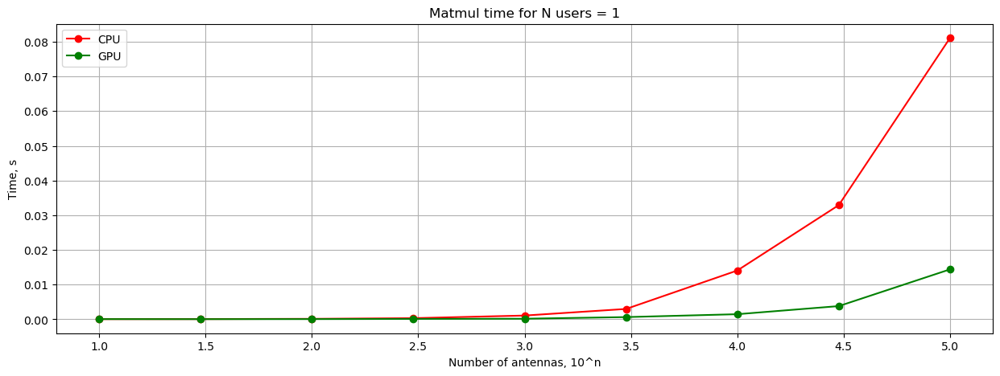

/tmp/ipykernel_1774/4184490058.py:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


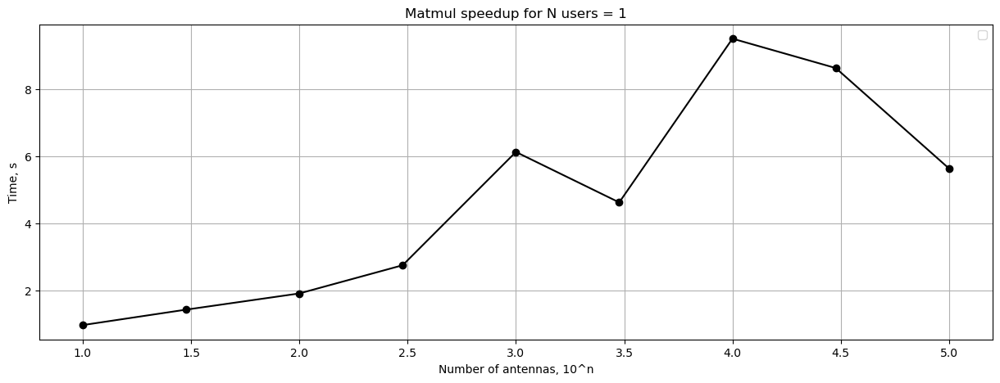

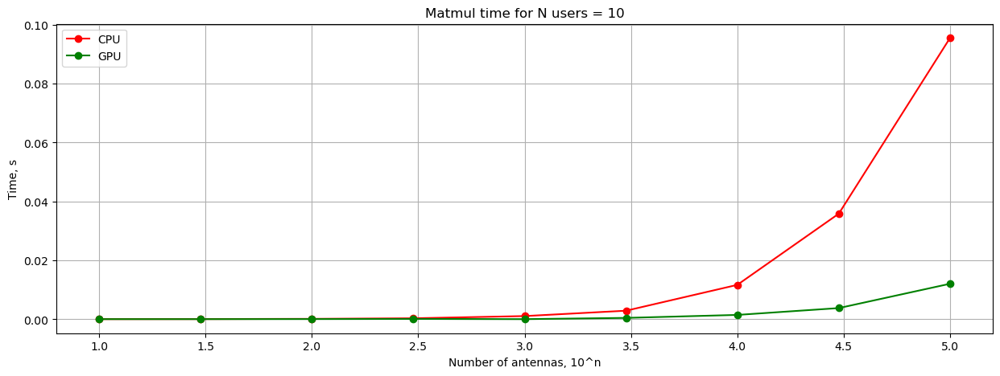

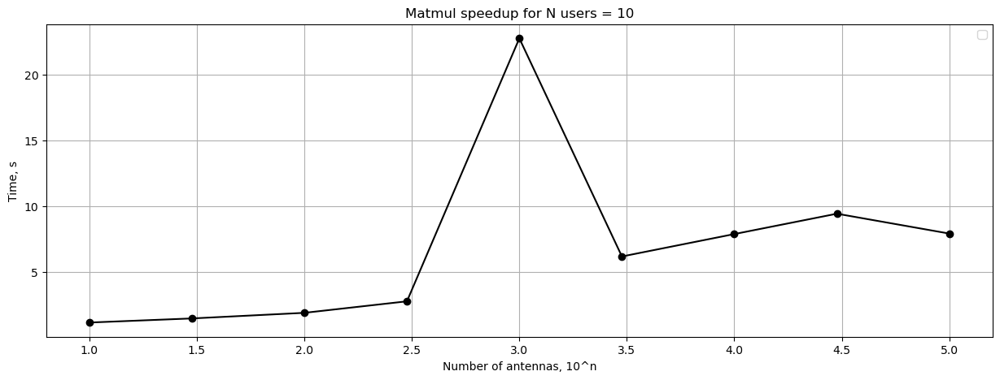

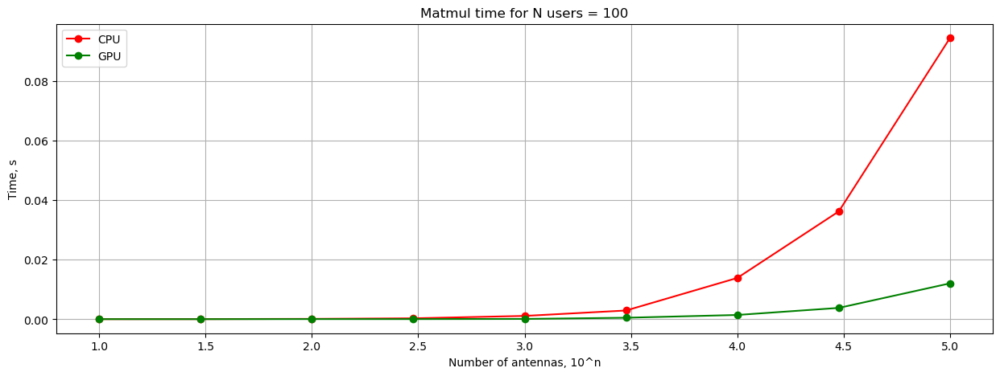

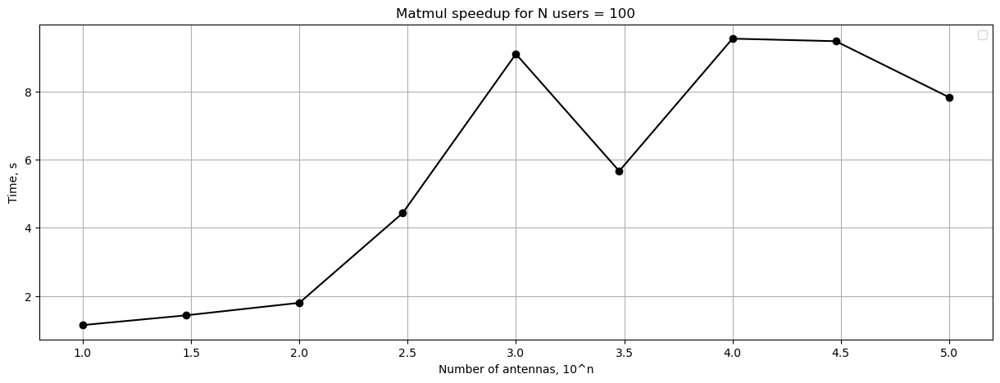

In [87]:
print2plot(np.log10(Ls_t), times_matmul1, "CPU", timesg_matmul1, "GPU", "Matmul time for N users = 1", "Number of antennas, 10^n", "Time, s", "o")
print1plot(np.log10(Ls_t), times_matmul1 / timesg_matmul1, "", "Matmul speedup for N users = 1", "Number of antennas, 10^n", "Time, s", "o")
print2plot(np.log10(Ls_t), times_matmul10, "CPU", timesg_matmul10, "GPU", "Matmul time for N users = 10", "Number of antennas, 10^n", "Time, s", "o")
print1plot(np.log10(Ls_t), times_matmul10 / timesg_matmul10, "", "Matmul speedup for N users = 10", "Number of antennas, 10^n", "Time, s", "o")
print2plot(np.log10(Ls_t), times_matmul100, "CPU", timesg_matmul100, "GPU", "Matmul time for N users = 100", "Number of antennas, 10^n", "Time, s", "o")
print1plot(np.log10(Ls_t), times_matmul100 / timesg_matmul100, "", "Matmul speedup for N users = 100", "Number of antennas, 10^n", "Time, s", "o")

So, we see that GPU speedup is around 8 for any L >= 10^3